## Домашнее задание: "Детекция объектов на изображении"

ФИО: Фадеев Роман Андреевич

## Цель задания:
Научиться самостоятельно решать задачу детекции.
## Описание задания:
В рамках данного домашнего задания предлагается решить задачу детекции мячей и настроить полный пайплайн обучения модели. 

Процесс выполнения задания следующий:

0. Выбор модели детекции для обучения:
    1. Выберите модель детекции для выполнения домашнего задания. Любую, кроме RetinaNet. Ее реализацию можно взять из открытых источников. Модель можно брать предобученную ( в этом случае в пункте 4. показать влияние предобучения на финальное качество). 
    2. Полезные ссылки: [PyTorch Vision Models](https://pytorch.org/vision/stable/models.html) (блок Object Detection), [SOTA модели детекции](https://paperswithcode.com/sota/object-detection-on-coco), [Возможный пример кода](https://github.com/AlekseySpasenov/dl-course/blob/autumn_2023/lecture8/detection_example/pytorch_detection_workshop.ipynb)

1. Подготовка обучающего набора данных
    1. Реализуйте корректный класс Dataset и Dataloader для выбранной модели (должен работать форвард вашей модели на том, что выходит из даталоадера) **0.5 балла**.
    2. Добавьте простые аугментации в датасет (аугментации, не затрагивающие изменение ground-truth bounding box) **0.5 балла**.
    3. Внедрите сложные аугментации (аугментации, затрагивающие изменение ground-truth bounding box. Например, аффинные преобразования: сдвиг, поворот и т.д.) **0.5 балла**.

    4. Полезные ссылки: https://pytorch.org/vision/stable/transforms.html , https://albumentations.ai

2. Реализация корректного train-loop и обучение модели:  
    1. Реализуйте эффективный train-loop для вашей модели и проведите обучение **2 балла**.
    2. Выполните несколько запусков обучения с различными параметрами, например: сравните влияние различных аугментаций, оцените влияние того была предобучена модель или нет, сравните результаты при изменении гиперпараметров итд (на ваш выбор) **0.5 балла**.
 
3. Валидация обученных моделей на тестовой выборке, вычисление метрики mAP
    1. Оцените качество моделей на тестовой части данных и рассчитайте метрику mAP **0.5 балл**
    2. Полезные ссылки: [mean_average_precision](https://github.com/bes-dev/mean_average_precision)

4. Выводы **0.5 балл**:
    1. Проанализируйте результаты обучения, визуально оцените качество работы модели.
    2. Прокомментируйте распространенные ошибки модели и предложите пути для улучшения финального решения.

Основные испорты

In [1]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
import json
import os

import cv2
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

Основные константы, используемые в работе

In [2]:
add_path = "big-data"
train_annotations_file = f"{add_path}/oi5_ball_filename_to_bbox_train.json"
val_annotations_file = f"{add_path}/oi5_ball_filename_to_bbox_val.json"
image_dir = add_path
predictions_annotation_file = f"{add_path}/oi5_ball_filename_to_bbox_pred.json"
model_save_path = "data/weights.pth"
model_load_path = "data/weights.pth"

RESIZE_HEIGHT = 800
RESIZE_WIDTH = 800

BATCH_SIZE = 12

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Реализация кастомного датасета

Тут разметка представляет из себя, помимо класса, также xmin, ymin, xmax, ymax, которые лежат в диапазоне [0, 1] (своего рода scale для bbox'ов)

In [3]:
class BallDataset(Dataset):
    def __init__(self, image_dir_path, annotations_file, transform=None):
        self.image_dir_path = image_dir_path
        self.transform = transform

        with open(annotations_file, 'r') as f:
            self.annotations = json.load(f)

    def __getitem__(self, idx):
        image_name = list(self.annotations.keys())[idx]
        image_path = os.path.join(self.image_dir_path, image_name)
        image = Image.open(image_path).convert("RGB")
        image = np.array(image)  # Преобразование в NumPy
        
        original_height = image.shape[0]
        original_width = image.shape[1]

        scale_x = original_width / RESIZE_WIDTH
        scale_y = original_height / RESIZE_HEIGHT

        current_annotation = self.annotations[image_name]
        boxes = []
        labels = []  # Добавляем фиктивные метки

        for bounding_box in current_annotation:
            xmin = bounding_box[0]
            xmax = bounding_box[1]
            ymin = bounding_box[2]
            ymax = bounding_box[3]
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(1)  # Фиктивная метка для всех объектов

        if self.transform:
            augmented = self.transform(image=image, bboxes=boxes, labels=labels)
            image = augmented['image']
            boxes = augmented['bboxes']

            boxes = torch.tensor(boxes, dtype=torch.float32)
            boxes = boxes * torch.tensor([scale_x, scale_y, scale_x, scale_y])

        target = {}
        target["image_id"] = torch.tensor([idx])
        target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT
        target["labels"] = torch.tensor(labels, dtype=torch.int64)

        return image, target

    def __len__(self):
        return len(self.annotations)

train_transform = A.Compose([
    A.Resize(800, 800),
    A.RandomBrightnessContrast(p=0.2),
    # A.HorizontalFlip(p=0.5),
    # A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=10, p=0.5),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

Функция для создания паддинга

In [4]:
def collater(data):
    # Параметры батча изображений
    imgs = [s[0] for s in data]
    annots = [s[1] for s in data]

    # Находим максимальные размеры для изображений в батче
    max_width = max(img.shape[1] for img in imgs)
    max_height = max(img.shape[2] for img in imgs)

    # Заполняем изображения до максимального размера
    padded_imgs = torch.zeros(len(imgs), 3, max_width, max_height)
    for i, img in enumerate(imgs):
        _, h, w = img.shape
        padded_imgs[i, :, :h, :w] = img

    # Сохраняем аннотации в виде словаря
    batch_annots = [{'image_id': annot['image_id'], 
                     'boxes': annot['boxes'], 
                     'labels': annot['labels']} for annot in annots]

    return padded_imgs, batch_annots

In [5]:
train_dataset = BallDataset(image_dir, train_annotations_file, transform=train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

val_dataset = BallDataset(image_dir, val_annotations_file, transform=train_transform)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

Функции из примера для отображения результатов

In [ ]:
def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

def draw_predictions(image, bboxes, scores, classes, class_to_label_map=None, threshold=0.5):
    palette = sns.color_palette(None, len(classes))
    image_with_predictions = image.copy()
    
    for bbox, score, class_int in zip(bboxes, scores, classes):
        if score < threshold:
            continue
        
        x1, y1, x2, y2 = bbox.numpy().astype(np.int32)
        label = class_to_label_map[class_int]
        color = palette[0]
        
        cv2.rectangle(image_with_predictions, (x1, y1), (x2, y2), np.array(color) * 255, 2)
        if class_to_label_map is not None:
            cv2.putText(image_with_predictions, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
        
        
    return image_with_predictions

In [7]:
image, target = train_dataset[0]
target["boxes"]

C:\Users\artrsyf\AppData\Local\Temp\ipykernel_14688\2201268922.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT


tensor([[247.5000, 663.0272, 297.5000, 748.3873],
        [432.5000, 710.6696, 488.7496, 798.0152],
        [481.2496, 663.0272, 531.2496, 744.4169],
        [491.2496, 611.4144, 538.7496, 659.0569],
        [587.5000, 627.2952, 633.7504, 698.7592],
        [750.0000, 587.5928, 791.2496, 649.1312]])

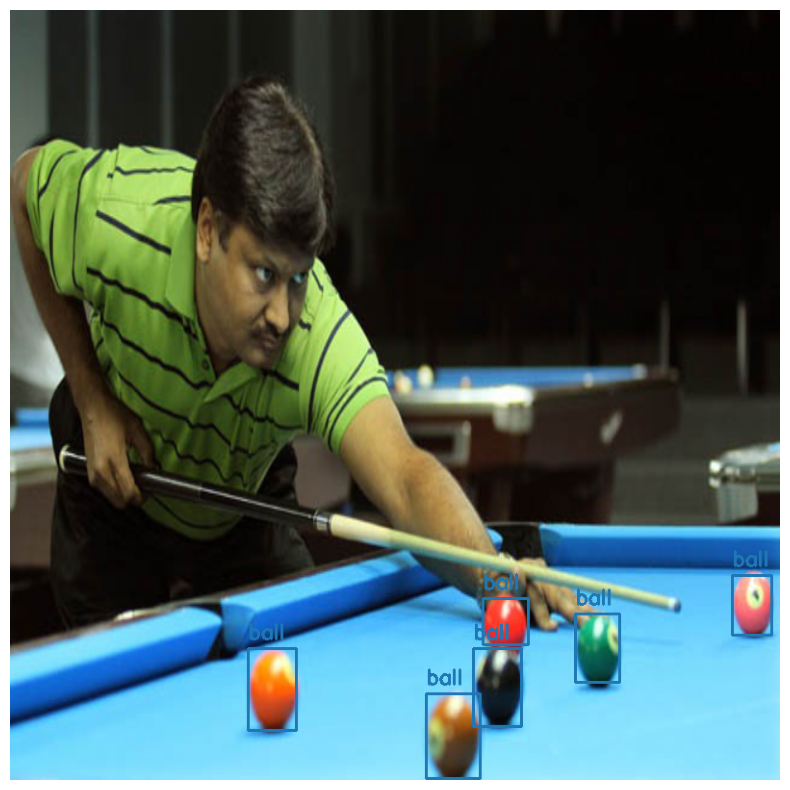

In [8]:
boxes_count = target["boxes"].size()[0]

image_np = image.permute(1, 2, 0).numpy()
image_with_predictions = draw_predictions(
    image_np, target["boxes"], 
    scores=[0.7] * boxes_count, 
    class_to_label_map={1: "ball"}, 
    classes=[1] * boxes_count,
)

show_image(image_with_predictions)


Чуть-чуть модифицируем функции вывода для работы с предсказаниями

In [ ]:
def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

def draw_predictions(image, bboxes, scores, classes, class_to_label_map=None, threshold=0.5, color_palette_idx=0):
    palette = sns.color_palette(["#1f77b4", "#ff7f0e"], 2)
    image_with_predictions = image.copy()
    
    for bbox, score, class_int in zip(bboxes, scores, classes):
        if score < threshold:
            continue
        
        x1, y1, x2, y2 = bbox.astype(np.int32)
        label = class_to_label_map[class_int]
        color = palette[color_palette_idx]
        
        cv2.rectangle(image_with_predictions, (x1, y1), (x2, y2), np.array(color) * 255, 2)
        if class_to_label_map is not None:
            cv2.putText(image_with_predictions, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
        
        
    return image_with_predictions

Описание класса детектора, содержащее методы обучения/валидации

In [10]:
from mean_average_precision import MetricBuilder

class BallDetector:
    def __init__(self, model, optimizer, scheduler, num_epochs=5):
        self.model = model

        self.optimizer = optimizer
        self.scheduler = scheduler

        self.num_epochs = num_epochs

    def train(self, train_loader):
        try:
            for epoch in range(self.num_epochs):
                self.model.train()

                for batch_images, batch_targets in train_loader:
                    images = [img.to(device) for img in batch_images]
                    targets = [{k: v.to(device) for k, v in t.items()} for t in batch_targets]

                    self.optimizer.zero_grad()
                    
                    losses_dict = self.model(images, targets)
                    losses = sum(loss for loss in losses_dict.values())
                    losses.backward()
                    
                    self.optimizer.step()

                self.scheduler.step()
                print(f"Epoch #{epoch + 1} loss: {losses.item()}")
        except KeyboardInterrupt:
            print("Interrupted")
    
    def eval(self, val_loader, pic_num=10, threshold=0.5):
        pic_printed = 0

        self.model.eval()
        class_to_label_map = {1: "ball"}  # Маппинг от класса в числовое значение

        metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=len(class_to_label_map))

        with torch.no_grad():
            for batch_images, batch_targets in val_loader:
                images = [img.to(device) for img in batch_images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in batch_targets]

                # Получаем предсказания модели
                predictions = self.model(images)

                for i in range(len(predictions)):
                    # Извлекаем предсказания
                    if pic_num > pic_printed: print(predictions[i])
                    
                    pred_boxes = predictions[i]['boxes'].cpu().numpy()
                    pred_scores = predictions[i]['scores'].cpu().numpy()
                    pred_labels = predictions[i]['labels'].cpu().numpy()

                    keep = pred_scores >= threshold
                    pred_boxes = pred_boxes[keep]
                    pred_scores = pred_scores[keep]
                    pred_labels = pred_labels[keep]

                    # Извлекаем истинные боксы
                    true_boxes = targets[i]['boxes'].cpu().numpy()
                    true_labels = targets[i]['labels'].cpu().numpy()

                    detections = np.hstack([pred_boxes, pred_scores[:, None], pred_labels[:, None]])
                    ground_truth = np.hstack([true_boxes, np.ones((true_boxes.shape[0], 1)), true_labels[:, None]])
                    
                    metric_fn.add(detections, ground_truth)

                    if pic_num > pic_printed:
                        pic_printed += 1
                        image = images[i].cpu().numpy().transpose(1, 2, 0)
                        image = image.astype(np.uint8)  # Преобразуем в 8-битное изображение

                        image_with_predictions = draw_predictions(
                            image,
                            pred_boxes,
                            pred_scores,
                            pred_labels,
                            class_to_label_map=class_to_label_map,
                            threshold=threshold,
                            color_palette_idx=0
                        )

                        final_image = draw_predictions(
                            image_with_predictions,
                            true_boxes,
                            np.ones(len(true_boxes)),  # Для истинных объектов считаем score равным 1
                            true_labels,
                            class_to_label_map=class_to_label_map,
                            threshold=threshold,
                            color_palette_idx=1
                        )

                        show_image(final_image)

        mAP = metric_fn.value(iou_thresholds=threshold)['mAP']
        print(f"mAP@{threshold}: {mAP:.4f}")

Определяем 2 класса: фон, мяч

In [11]:
NUM_CLASSES = 2

model = fasterrcnn_resnet50_fpn(pretrained=True)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES)

model = model.to(device)

C:\dev\miniconda\envs\ds\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\dev\miniconda\envs\ds\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)

In [ ]:
detector = BallDetector(model, optimizer, scheduler, num_epochs=3)

In [ ]:
from torch.utils.data import Subset

subset_indices = list(range(120))
train_subset = Subset(train_dataset, subset_indices)
subset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

Методы сохранения/загрузки обученных моделей

In [ ]:
def save_model(model, optimizer, scheduler, path="ball_detector.pth"):
    """Сохраняет состояние модели, оптимизатора и шедулера."""

    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict()
    }, path)

    print(f"Model saved to {path}")

def load_model(ball_detector, path="ball_detector.pth"):
    """Загружает состояние модели, оптимизатора и шедулера из файла."""

    checkpoint = torch.load(path)
    ball_detector.model.load_state_dict(checkpoint['model_state_dict'])
    ball_detector.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    ball_detector.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

Обучалась модель 6 эпох и 18 часов в сумме, loss на 6-ой эпохе был ~0,25

In [17]:
MODEL_STATE_READY = False

if MODEL_STATE_READY:
    load_model(detector)
else:
    detector.train(train_loader) ## 1. Обучал 6 эпох 18 часов

    # save_model(detector.model, detector.optimizer, detector.scheduler)

C:\Users\artrsyf\AppData\Local\Temp\ipykernel_14688\2201268922.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT


RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


Результаты работы модели, первые 10 предиктов отобразим на картинках

C:\Users\artrsyf\AppData\Local\Temp\ipykernel_25512\2201268922.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT


{'boxes': tensor([[706.8830, 577.4944, 733.5251, 608.6975],
        [425.9742, 506.9117, 450.5280, 534.4362],
        [454.5802, 461.8289, 477.8450, 485.8363],
        [326.3356, 413.6190, 723.1102, 682.9011],
        [489.6469, 455.9197, 505.3975, 470.6676],
        [458.0197, 515.1689, 473.2334, 537.2271],
        [  2.5019, 517.1269,  78.2560, 689.3001],
        [ 25.4582, 718.5109,  69.9126, 800.0000],
        [ 99.8302, 597.2371, 142.6622, 684.9891],
        [189.7623, 715.7261, 211.5452, 756.9419],
        [ 39.4075, 651.3367, 124.3413, 800.0000],
        [  7.0785, 305.0458,  95.4707, 483.2551],
        [485.9964, 453.2037, 508.7304, 476.5447],
        [457.6961, 464.6389, 474.2524, 480.2148],
        [209.6293, 759.3852, 230.4092, 798.7167],
        [429.6993, 507.4006, 448.8018, 524.9803],
        [350.9225, 250.4589, 739.1839, 800.0000],
        [505.8779, 435.1101, 722.0201, 770.5140]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

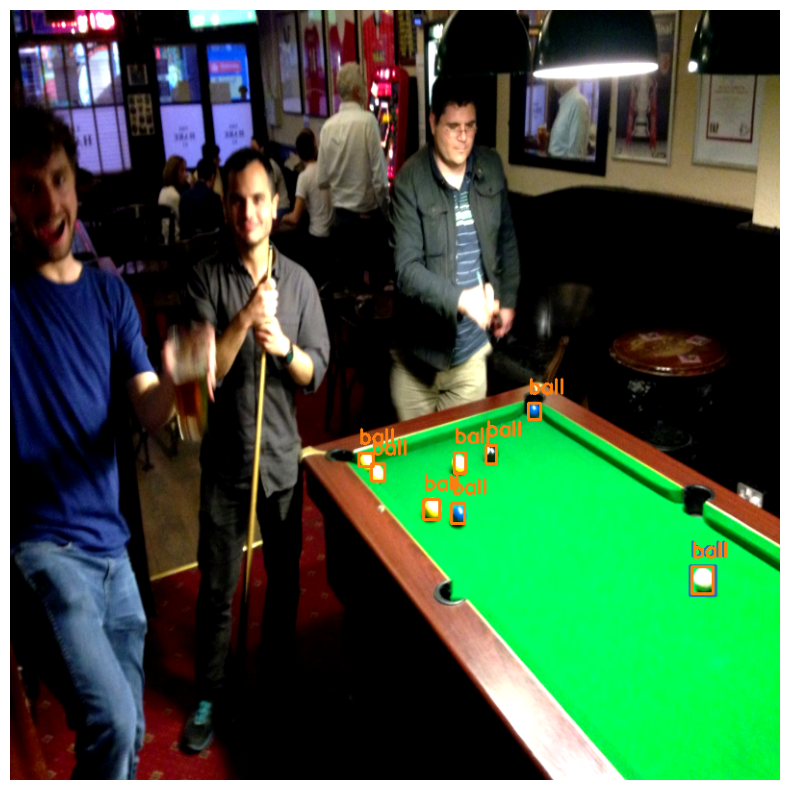

{'boxes': tensor([[294.4127,  46.9690, 427.8875, 184.2917],
        [295.9675, 350.3391, 371.5358, 418.7293],
        [104.7170, 156.7239, 125.9400, 199.2574],
        [246.7475, 342.6841, 375.5925, 464.4624],
        [263.2321, 280.4881, 348.0276, 331.5246],
        [ 90.1962, 144.5855, 133.3542, 224.1861],
        [317.8835,  94.4681, 419.8745, 143.7048],
        [ 94.9367, 155.7690, 116.7608, 200.3271],
        [538.6000, 471.4585, 653.1578, 608.3571],
        [  2.4549, 138.1302,  42.3109, 158.5713],
        [ 95.2435, 165.2724, 136.6652, 187.9754],
        [329.1837, 268.9736, 351.5466, 311.9081],
        [295.3603, 279.8594, 319.2715, 326.7935],
        [314.5014,  63.0795, 435.1543, 114.3946]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.4794, 0.3778, 0.2060, 0.1329, 0.0864, 0.0860, 0.0853, 0.0841, 0.0826,
        0.0650, 0.0626, 0.0557, 0.0512, 0.0511], device='cuda:0')}


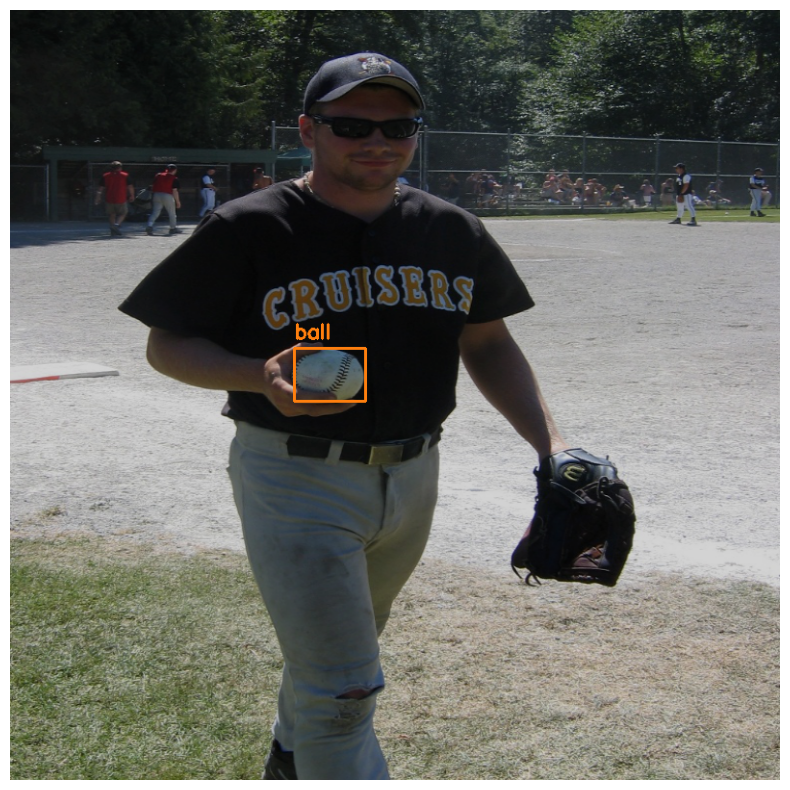

{'boxes': tensor([[450.3440, 723.3720, 466.0074, 743.6417],
        [ 22.9290, 684.6354,  46.6937, 726.6667],
        [445.0362, 720.7731, 466.7500, 752.2880],
        [607.3471,  62.2494, 681.1281, 138.8723],
        [ 29.2675, 683.0595,  54.1798, 722.5181],
        [194.4185, 326.2731, 290.0599, 472.6589],
        [298.1804, 170.2516, 795.4909, 774.1014],
        [705.6132, 107.2254, 749.7975, 146.9514],
        [  9.2304, 173.5910, 416.5653, 767.5094],
        [340.8146,  30.1655, 396.1652, 123.0871],
        [ 16.5881, 692.2280,  58.8004, 717.0947]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.2607, 0.2586, 0.1901, 0.1300, 0.1294, 0.1096, 0.0764, 0.0672, 0.0665,
        0.0602, 0.0598], device='cuda:0')}


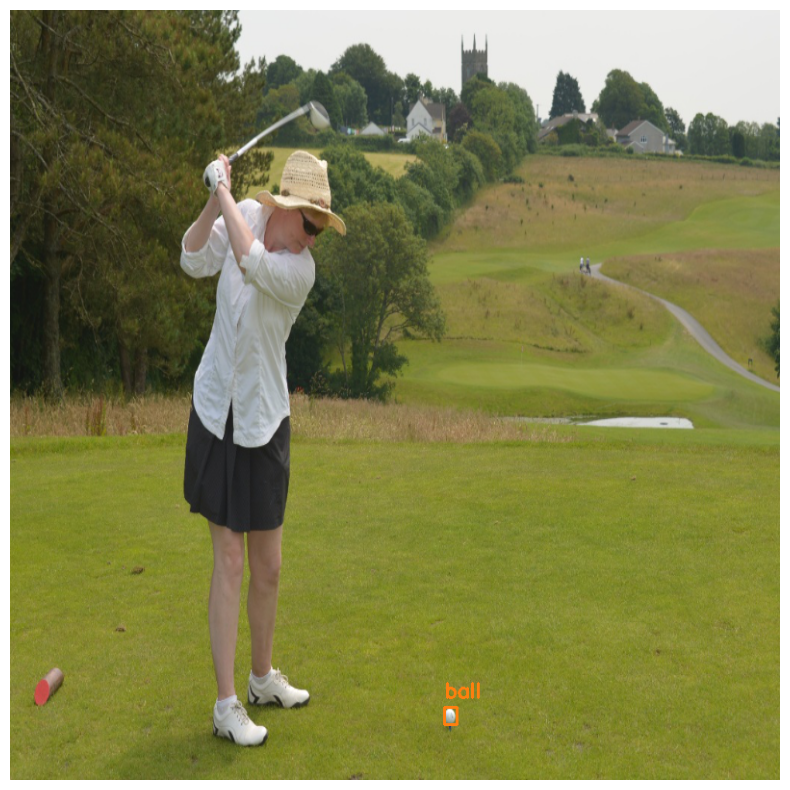

{'boxes': tensor([[214.7541, 351.6195, 355.9824, 528.4190],
        [234.4454, 404.4327, 289.2700, 498.8649],
        [341.5073, 309.6985, 453.1877, 464.1259],
        [463.4865, 304.5714, 573.1640, 460.8635],
        [ 17.0608, 229.4810, 369.5558, 800.0000],
        [ 27.5722, 262.1783, 719.6321, 605.6158],
        [580.8708,  17.5500, 774.5620, 247.4911],
        [  0.0000, 499.6071, 740.2947, 798.9950],
        [268.0494, 275.9781, 332.3817, 358.7768],
        [552.9730, 221.0951, 644.8762, 381.0919],
        [727.4049, 291.9956, 798.3059, 332.7218]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.8051, 0.4879, 0.3668, 0.1697, 0.1637, 0.1427, 0.1312, 0.1206, 0.1026,
        0.0911, 0.0583], device='cuda:0')}


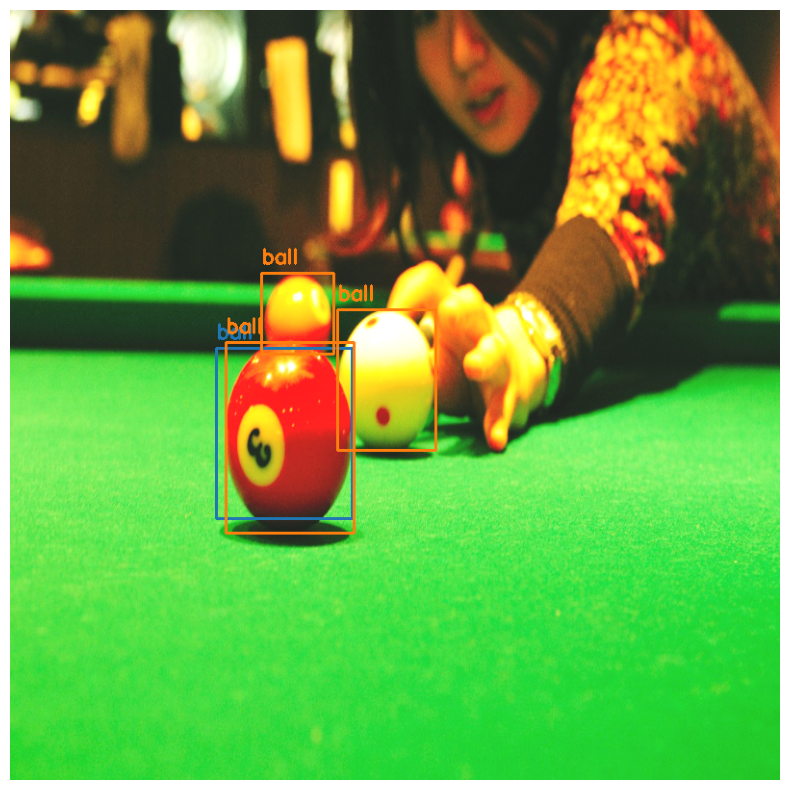

{'boxes': tensor([[750.1964, 749.5891, 799.3882, 799.3680],
        [761.3962, 747.7837, 782.8295, 789.9231],
        [714.1062, 772.8896, 733.9034, 799.8962],
        [703.4568, 767.0410, 737.1400, 800.0000],
        [755.4836, 745.1889, 788.8704, 777.9865],
        [706.2768, 772.9402, 726.0960, 800.0000],
        [759.1703, 761.2100, 792.9471, 797.2889],
        [706.6365, 779.2184, 748.4631, 796.9752],
        [760.1360, 757.2551, 799.2010, 778.7721],
        [722.0167, 773.8047, 741.5009, 800.0000],
        [768.6545, 747.5495, 790.2376, 789.9777],
        [288.3242, 199.1680, 794.5034, 800.0000],
        [148.7755,  31.9573, 236.7015, 219.0135],
        [760.5999, 749.9979, 798.9632, 770.9208],
        [744.1961, 757.2410, 787.3227, 778.2950],
        [742.5901, 752.8438, 761.8632, 791.8143],
        [699.8951, 784.2584, 740.2599, 800.0000],
        [743.9626, 750.1019, 786.8673, 770.6307],
        [710.0323, 771.2463, 752.6846, 789.3314],
        [737.5902, 743.0131, 800.0000, 7

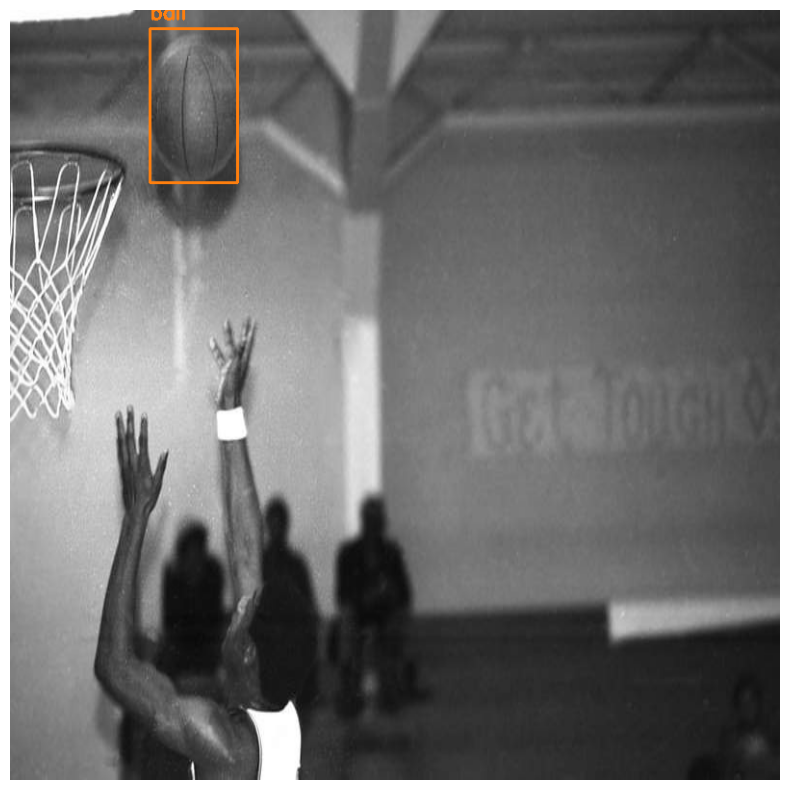

{'boxes': tensor([], device='cuda:0', size=(0, 4)), 'labels': tensor([], device='cuda:0', dtype=torch.int64), 'scores': tensor([], device='cuda:0')}


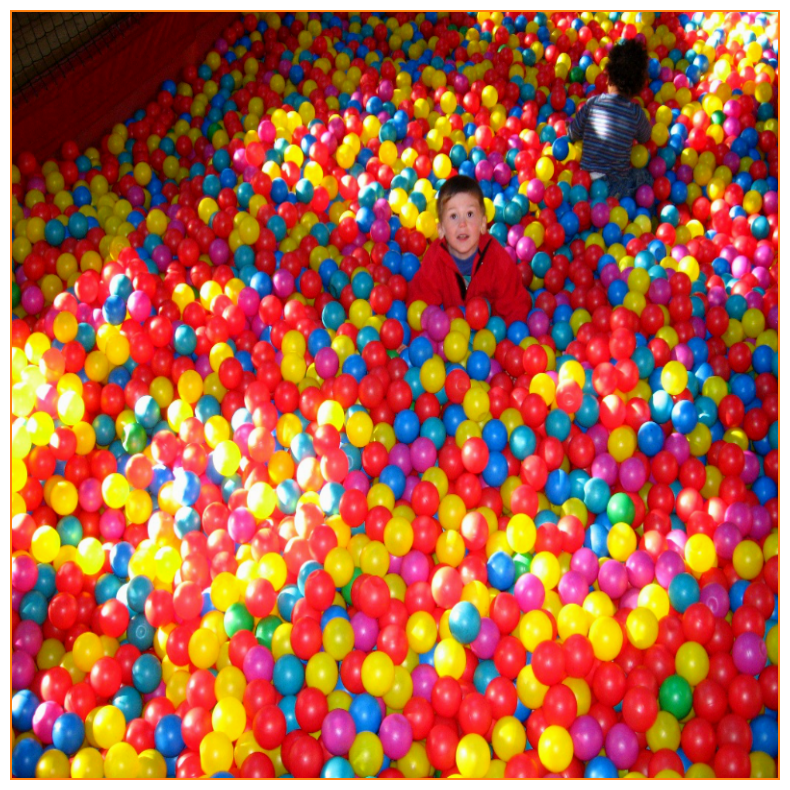

{'boxes': tensor([[274.0204, 663.0760, 413.7899, 800.0000],
        [390.8659, 213.5146, 474.6706, 391.7399],
        [535.1841,  48.9805, 641.9123, 253.3434],
        [  0.0000, 241.0121, 349.3496, 536.7141],
        [650.5493, 257.2051, 739.4711, 437.9417],
        [666.3431, 324.5180, 732.9942, 397.8241],
        [  1.6194,  75.1501, 299.2805, 748.8524],
        [ 32.8432, 219.9065, 228.8689, 580.2378],
        [665.4042, 295.7668, 761.7056, 473.6697],
        [317.4656,   3.4058, 496.4989,  94.6061],
        [530.4289, 263.9151, 786.1247, 451.6193],
        [375.8638,  12.8889, 447.7242,  85.1608],
        [ 50.0652, 250.2330, 278.0891, 463.1802]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.3070, 0.2347, 0.1729, 0.1629, 0.1368, 0.1184, 0.1023, 0.1001, 0.0789,
        0.0774, 0.0694, 0.0677, 0.0670], device='cuda:0')}


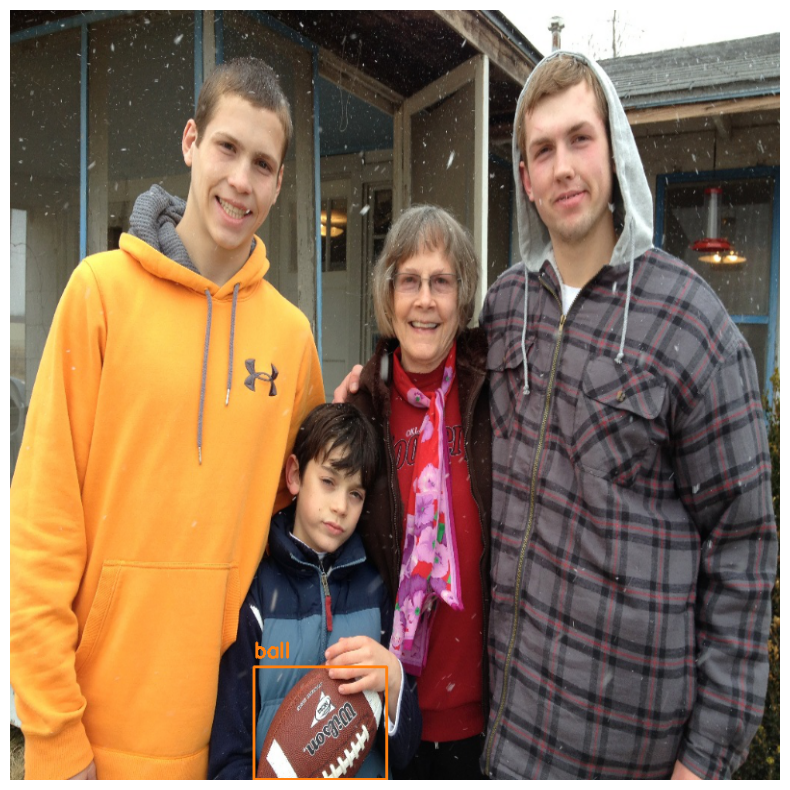

{'boxes': tensor([[1.2245e+02, 5.4832e+02, 1.9161e+02, 6.2291e+02],
        [6.7976e+02, 1.4316e+02, 7.2651e+02, 2.2772e+02],
        [6.9371e+02, 2.0342e+02, 7.8015e+02, 3.7928e+02],
        [3.9836e+02, 2.2095e+02, 4.6806e+02, 2.9188e+02],
        [0.0000e+00, 1.5736e+02, 4.2033e+02, 7.0304e+02],
        [4.4317e+02, 3.9368e+02, 5.3399e+02, 4.3867e+02],
        [3.5444e+02, 4.0530e+02, 3.9884e+02, 4.9389e+02],
        [2.5846e+02, 9.9090e+00, 3.4871e+02, 5.5069e+01],
        [4.4640e+02, 2.3746e+02, 4.6561e+02, 2.7649e+02],
        [4.9375e+02, 3.9014e+02, 5.1489e+02, 4.3589e+02],
        [4.7436e+02, 3.7405e+02, 5.1858e+02, 4.6112e+02],
        [3.2208e+02, 4.2502e+02, 4.1528e+02, 4.7067e+02],
        [5.2582e+02, 2.3804e+02, 5.4654e+02, 2.8214e+02],
        [3.3819e+02, 4.0231e+02, 3.8364e+02, 4.9367e+02],
        [4.6291e+02, 2.2242e+02, 4.8143e+02, 2.5973e+02],
        [4.4353e+02, 3.3612e+02, 4.6138e+02, 3.7022e+02],
        [3.0805e+02, 3.6299e+02, 3.9786e+02, 5.3669e+02],
    

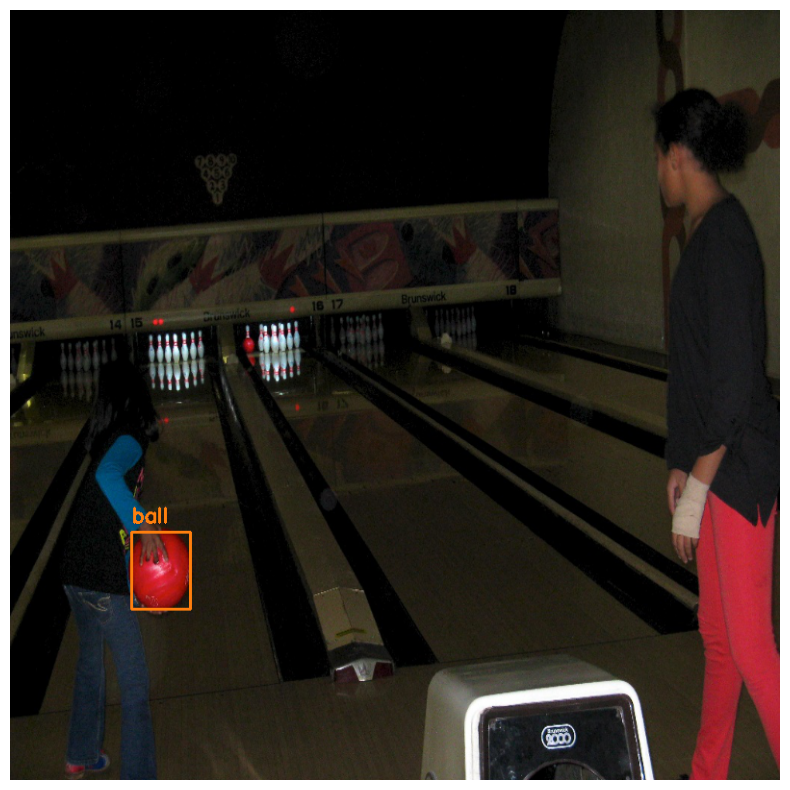

{'boxes': tensor([[540.0692, 283.9030, 728.6035, 467.9670],
        [523.8086, 314.0353, 698.7982, 573.3870],
        [748.2564, 458.7779, 771.7203, 493.5149],
        [241.5951, 580.3492, 396.0750, 683.5048],
        [492.7049, 578.9368, 503.5008, 649.9965],
        [712.1942, 101.8986, 734.0181, 146.9488],
        [ 19.1956, 431.6887,  65.0949, 520.3627],
        [484.2084, 580.3823, 508.4694, 649.1632]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.3396, 0.1568, 0.1237, 0.1088, 0.1060, 0.0953, 0.0861, 0.0710],
       device='cuda:0')}


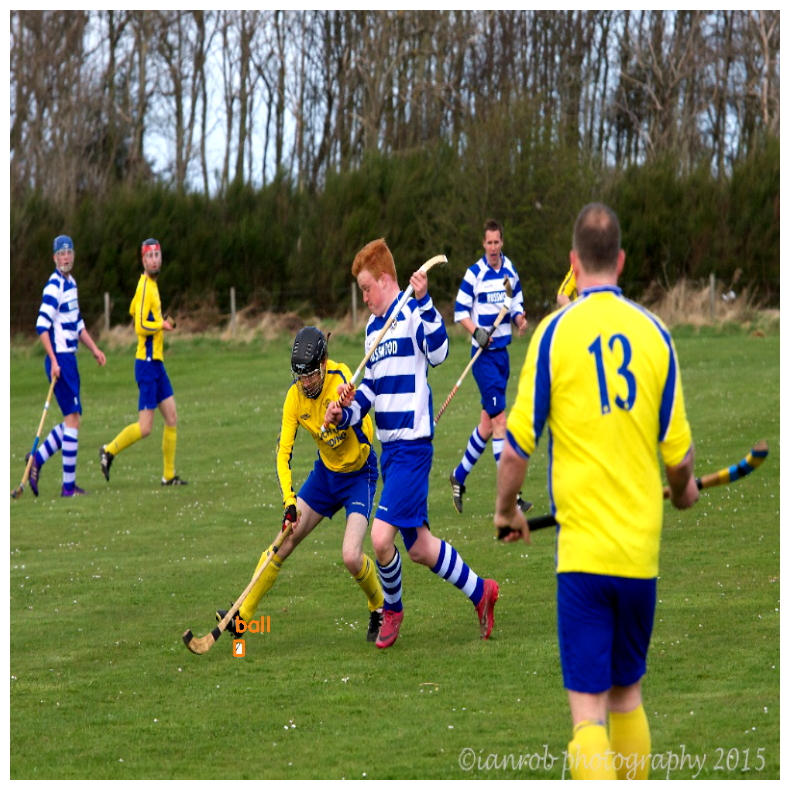

{'boxes': tensor([[2.5299e+02, 5.9985e+02, 3.0475e+02, 6.8725e+02],
        [3.6815e+02, 6.3266e-01, 4.1520e+02, 6.7551e+01],
        [5.9769e+02, 6.0801e+02, 6.8803e+02, 7.7508e+02],
        [5.6499e+02, 3.3463e+02, 6.6080e+02, 5.0395e+02],
        [5.3231e+00, 3.1056e+02, 1.5081e+02, 3.9659e+02],
        [2.5437e+02, 1.3443e+02, 3.8418e+02, 2.6295e+02],
        [7.9113e+02, 3.9044e+02, 7.9996e+02, 4.3928e+02],
        [2.5715e+02, 1.3530e+02, 3.2649e+02, 2.0910e+02],
        [7.8313e+02, 3.9166e+02, 8.0000e+02, 4.3048e+02],
        [6.9405e+02, 4.7066e+00, 7.6277e+02, 8.0855e+01],
        [7.3819e+02, 2.1670e+02, 7.8126e+02, 2.9701e+02],
        [5.7448e+02, 3.6148e+02, 6.4948e+02, 4.3878e+02],
        [6.8687e+02, 0.0000e+00, 7.6351e+02, 1.3739e+02],
        [6.0783e+02, 6.2751e+02, 6.7670e+02, 7.0132e+02],
        [6.3347e+02, 1.2577e+00, 6.7880e+02, 7.0867e+01],
        [5.7491e+02, 6.0338e+02, 7.1623e+02, 7.2700e+02]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1

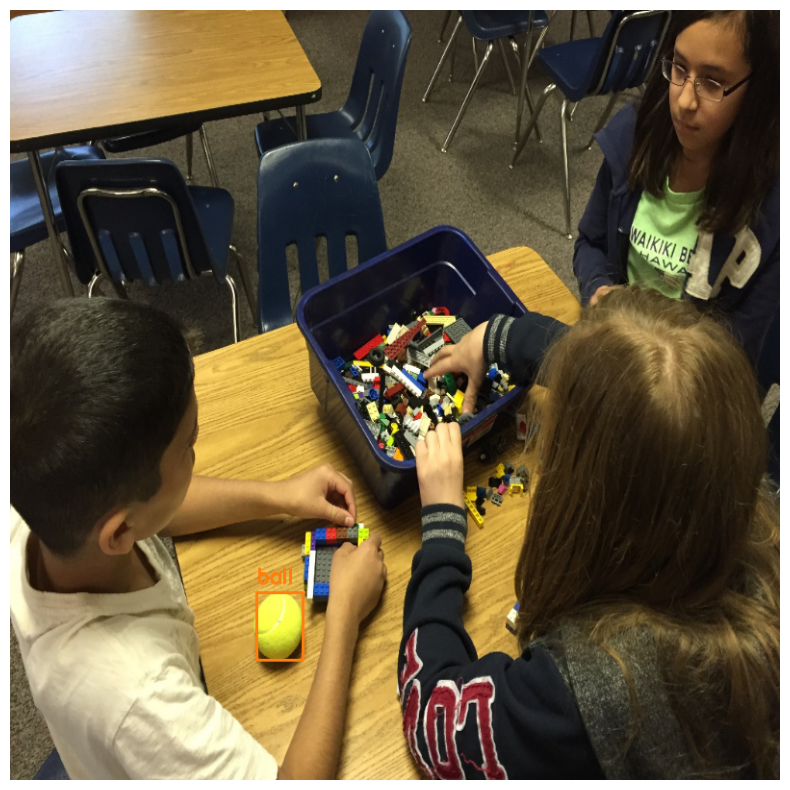

KeyboardInterrupt: 

In [17]:
detector.eval(val_loader, pic_num=10)

## Выводы

- Выбрана предобученная нейронная сеть Faster RCNN;
- Под нее реализован класс датасета, добавлены некоторые аугментации;
- Реализован train-loop;
- Модель неплохо детектирует мячи, но, я думаю, есть некоторая проблема с разметкой данных, класс "ball" - очень общий;
- Мне нравится, как работает вычисления скора для предсказаний, мало False Positive предсказаний. Но все еще много False Negative предсказаний, когда модели не хватает уверенности для детекции мяча;
- Здесь крайне не понимаю задания с аугментациями. 
    - Простой препроцессинг изображений показал свою не особую эффективность еще в ДЗ 2, очевидно, что любое изменение выгодное для одного изображение не выгодно для другого. Но в этом случае придется еще провести большую работу по подгону боксов под изменения;
    - Если обратиться к определению аугментаций, то это добавление новых изображений на основе имеющихся, однако датасет и так довольно большой, и я в этом вообще не вижу смысла. Тем более, на ~4 GB VRAM одна эпоха длится 3+ часа, очень сложно экспериментировать;
    - Единтсвенное, что нахожу полезным, повышение контраста.
